In [ ]:
!pip install -U langchain-huggingface langchain-unstructured "unstructured[pdf]" langchain-community langchain unstructured sentence-transformers faiss-cpu accelerate bitsandbytes transformers


## Librerias

In [ ]:
import os

os.chdir("/home/kmuenala/degre_project")

from google.colab import userdata

hf_token= userdata.get('HF_TOKEN')

In [ ]:
import re
from pathlib import Path
from typing import List
from concurrent.futures import ThreadPoolExecutor, as_completed

import torch
from langchain_unstructured import UnstructuredLoader
from langchain.text_splitter import RecursiveCharacterTextSplitter
from langchain.embeddings import HuggingFaceBgeEmbeddings
from langchain.vectorstores import FAISS
from sentence_transformers import CrossEncoder


from unstructured.cleaners.core import (clean_extra_whitespace
                                        ,group_broken_paragraphs)
from langchain_huggingface import HuggingFacePipeline
from langchain.prompts import PromptTemplate
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from transformers import (AutoTokenizer
                          ,AutoModelForCausalLM
                          ,BitsAndBytesConfig
                          ,pipeline)


In [ ]:
def get_file_paths(root_path: str) -> List[str]:
    """Recursively get all file paths from the given root path."""
    return [str(file) for file in Path(root_path).rglob('*') if (file.is_file()) & ('pdfs' in str(file))]

def load_and_split_document(file_path: str, text_splitter: RecursiveCharacterTextSplitter) -> List:
    """Load and split a single document."""
    loader = UnstructuredLoader(file_path, post_processors=[clean_extra_whitespace, group_broken_paragraphs])
    return loader.load_and_split(text_splitter=text_splitter)
def generate_pdf_separators() -> List[str]:
    """
    Generate a list of separators tailored for PDF documents.
    """
    # Basic structural separators
    structural_seps = [
        "\n\n\n",
        "\n\n",       # Saltos de línea dobles, típicos entre párrafos
        "\f",         # Saltos de página (form feed en PDF)
        "\n\d+\. ",   # Numeración seguida de un punto (por ejemplo, "1. ", "2. ")
        "\n• ",       # Viñetas de listas (como las que aparecen en muchos PDFs)
        "\n- ",       # Separador para guiones (también común en listas)
        "\n===+\n",   # Separadores de líneas largas (pueden aparecer como divisores)
        "\n---+\n",   # Variantes de líneas divisorias
        "\n___+\n",   # Otra variante de líneas divisorias
        "\n",         # Un simple salto de línea para casos en los que no haya una estructura clara
        " ",          # Separación por espacios si no hay mejor opción
        "",           # Cadena vacía para casos residuales
    ]

    # Heading patterns (adjust regex patterns as needed)
    heading_seps = [
        r"\n[\d\.]+\s+[A-Z]",  # Numbered headings: "1. Title", "1.1 Subtitle"
        r"\n[A-Z][a-z]+\s+\d+[\.\:]\s+",  # "Chapter 1: ", "Section 2."
        r"\n[A-Z][A-Z\s]+\n",  # ALL CAPS headings
    ]

    # Page number patterns
    page_num_seps = [
        r"\n\s*\-\s*\d+\s*\-\s*\n",  # Centered page numbers: "- 1 -"
        r"\n\s*\d+\s*\n",            # Simple page numbers: "1"
    ]

    # Combine all separators
    separators = structural_seps + heading_seps + page_num_seps

    return separators

In [ ]:
path= os.getcwd()
files= get_file_paths(path)

PDF_SEPARATORS = generate_pdf_separators()
CHUNK_SIZE = 512

text_splitter = RecursiveCharacterTextSplitter(
        separators=PDF_SEPARATORS,
        chunk_size=CHUNK_SIZE,
        chunk_overlap=int(CHUNK_SIZE/10),
        length_function=len,
        add_start_index=True,
        strip_whitespace=True,
        is_separator_regex=False,
)

docs = []
for file in files:
    doc_chunks = load_and_split_document(file, text_splitter)
    docs.extend(doc_chunks)
    print(f"Processed file: {file}")

Processed file: /home/kmuenala/degre_project/pdfs/completo/hunta_mamallakta_tantanakuy.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Erupciones explosivas- Peligros kichwa (1).pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley_seguridad-_kichwa.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/llaktayuk_chaypikachun_tantachik_hatun_kamachiy.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley mikuna_kamachiy.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/TESIS.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley Mineria kichwa.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley Alimentacion Escolar K.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Erupciones explosivas kichwa 2022.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley Empresa Publica K.pdf
Processed file: /home/kmuenala/degre_project/pdfs/completo/Ley Soberania Alimentaria K.pdf
Processed 

## Ajustar la longuitud de Chunk.

In [ ]:
from sentence_transformers import SentenceTransformer
import pandas as pd
import matplotlib.pyplot as plt

MODEL_EMBEDDING = 'intfloat/multilingual-e5-large'

# To get the value of the max sequence_length, we will query the underlying `SentenceTransformer` object used in the RecursiveCharacterTextSplitter
print(f"Model's maximum sequence length: {SentenceTransformer(MODEL_EMBEDDING).max_seq_length}")

tokenizer = AutoTokenizer.from_pretrained(MODEL_EMBEDDING)

Model's maximum sequence length: 512


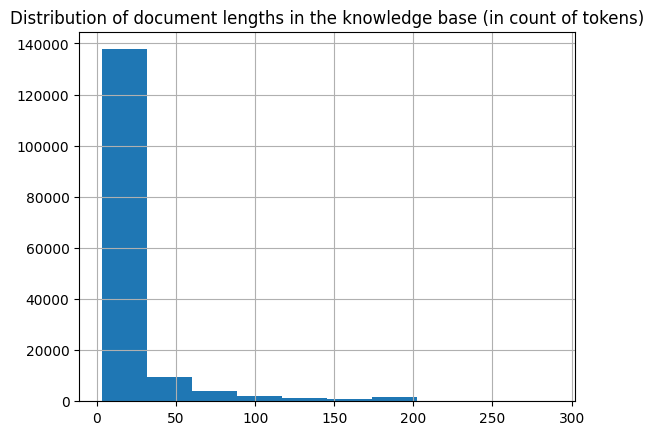

In [ ]:
lengths = [len(tokenizer.encode(doc.page_content)) for doc in docs]

# Plot the distribution of document lengths, counted as the number of tokens
fig = pd.Series(lengths).hist()
plt.title("Distribution of document lengths in the knowledge base (in count of tokens)")
plt.show()

## Modelo Embedding

In [ ]:
device= torch.device('cuda' if torch.cuda.is_available() else 'cpu')

embedding_model = HuggingFaceBgeEmbeddings(
                      model_name=MODEL_EMBEDDING,
                      model_kwargs={"device": device},
                      encode_kwargs={"normalize_embeddings": True}, # set True to compute cosine similarity
                  )

In [ ]:
from langchain_community.vectorstores.utils import DistanceStrategy

vectorstore= FAISS.from_documents(documents=docs, embedding=embedding_model, distance_strategy=DistanceStrategy.COSINE)

In [ ]:
len(vectorstore.index_to_docstore_id)

157775

In [ ]:
save_index= True
load_index= False

if save_index:
  vectorstore.save_local("../faiss_index_512")

if load_index:
  vectorstore = FAISS.load_local(
      "../faiss_index", embedding_model, allow_dangerous_deserialization=True
  )

In [ ]:
retriever = vectorstore.as_retriever(search_kwargs={"k": 100})

## Visualizacion de la fragmentacion

In [ ]:
query_kichwa = "Ñukaka Kichwa parlani"
query_spanish = "Yo hablo Español"
query_english = "I speak English"
query_vector_kichwa = embedding_model.embed_query(query_kichwa)
query_vector_spanish = embedding_model.embed_query(query_spanish)
query_vector_english = embedding_model.embed_query(query_english)

In [ ]:
import pacmap
import numpy as np
import plotly.express as px

embedding_projector = pacmap.PaCMAP(n_components=2, n_neighbors=None, MN_ratio=0.5, FP_ratio=2.0, random_state=42)

embeddings_2d = [
    list(vectorstore.index.reconstruct_n(idx, 1)[0]) for idx in range(len(docs))
] + [query_vector_kichwa, query_vector_spanish, query_vector_english]

# Fit the data (the index of transformed data corresponds to the index of the original data)
documents_projected = embedding_projector.fit_transform(np.array(embeddings_2d), init="pca")

/usr/local/lib/python3.10/dist-packages/pacmap/pacmap.py:822: UserWarning:




In [ ]:
df = pd.DataFrame.from_dict(
    [
        {
            "x": documents_projected[i, 0],
            "y": documents_projected[i, 1],
            "source": docs[i].metadata["source"].split("/")[5],
            "extract": docs[i].page_content[:100] + "...",
            "symbol": "circle",
            "size_col": 4,
        }
        for i in range(len(docs))
    ]
    + [
        {
            "x": documents_projected[-3, 0],
            "y": documents_projected[-3, 1],
            "source": "query kichwa",
            "extract": query_vector_kichwa,
            "size_col": 100,
            "symbol": "star",
        }
    ]
    + [
        {
            "x": documents_projected[-2, 0],
            "y": documents_projected[-2, 1],
            "source": "query spanish",
            "extract": query_vector_spanish,
            "size_col": 100,
            "symbol": "star",
        }
    ]
    + [
        {
            "x": documents_projected[-1, 0],
            "y": documents_projected[-1, 1],
            "source": "query english",
            "extract": query_vector_english,
            "size_col": 100,
            "symbol": "star",
        }
    ]
)

# Visualize the embedding
fig = px.scatter(
    df,
    x="x",
    y="y",
    color="source",
    hover_data="extract",
    size="size_col",
    symbol="symbol",
    color_discrete_map={"query kichwa": "blue"
                        ,"query spanish": "red"
                        ,"query english": "green"},
    width=1000,
    height=700,
)
fig.update_traces(
    marker=dict(opacity=1, line=dict(width=0, color="DarkSlateGrey")),
    selector=dict(mode="markers"),
)
fig.update_layout(
    legend_title_text="<b>Chunk source</b>",
    title="<b>2D Projection of Chunk Embeddings via PaCMAP</b>",
)
fig.show()

## Modelo Llama3.1

In [ ]:
reader_model_name = "meta-llama/Meta-Llama-3.1-8B"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_use_double_quant=True,
    bnb_4bit_quant_type="nf4",
    bnb_4bit_compute_dtype=torch.bfloat16,
)

tokenizer = AutoTokenizer.from_pretrained(reader_model_name)
model = AutoModelForCausalLM.from_pretrained(reader_model_name
                                             ,use_auth_token= hf_token
                                             ,device_map="auto"
                                            #  ,quantization_config=bnb_config
                                             )

/usr/local/lib/python3.10/dist-packages/transformers/models/auto/auto_factory.py:469: FutureWarning: The `use_auth_token` argument is deprecated and will be removed in v5 of Transformers. Please use `token` instead.
  warnings.warn(


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
text_generation_pipeline = pipeline(
    model=model,
    tokenizer=tokenizer,
    task="text-generation",
    temperature=0.2,
    do_sample=True,
    repetition_penalty=1.1,
    return_full_text=True,
    max_new_tokens=400,
    pad_token_id = tokenizer.eos_token_id
)

llm = HuggingFacePipeline(pipeline=text_generation_pipeline)

prompt_template = """
<|context|>
Answer the question based on your knowledge. Use the following context to help:
{context}
<|question|>
{question}
<|answer|>
"""

prompt = PromptTemplate(
    input_variables=["context", "question"],
    template=prompt_template,
)

llm_chain = prompt | llm | StrOutputParser()

rag_chain = {"context": retriever, "question": RunnablePassthrough()} | llm_chain

In [ ]:
question = "Que siginifica Shuti en Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 284.35400000000004), (118.82, 296.35400000000004), (297.036, 296.35400000000004), (297.036, 284.35400000000004)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 145, 'parent_id': '2ed980faee73409804c15c411f932fc8', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'e71d700ff2f114b9a79c44cb79f2d51d', 'start_index': 0}, page_content='kichwa? SI ( ) NO ( ) ¿Por qué?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 735.859), (118.82, 763.659), (306.6680000000001, 763.659), (306.6680000000001, 7

In [ ]:
question = "Que siginifica Shuti en Kichwa?"
answer_llm= llm.invoke(question)
print(answer_llm)

Que siginifica Shuti en Kichwa? Que significa Shuti en Kichwa?
Shuti in Kichwa means “to be happy”. It is a verb that can also be used as an adjective to describe someone who is happy. The word comes from the Spanish word “alegre” which means “happy”.
In Ecuador, where Kichwa is spoken, it is common to hear people say “shutis” when they are feeling happy or content. This expression has become so popular that it has even been adopted by non-Kichwa speakers.
The use of this word reflects the importance of happiness and joy in Kichwa culture. In fact, many traditional songs and dances celebrate these emotions. So next time you want to express your happiness in Kichwa, remember to say “shutis!”
What Does Shuti Mean in Kichwa?
Shuti is a term used in the Kichwa language to refer to a person’s soul or spirit. It is often used in conjunction with other words such as “kawsay” (life) or “yachay” (knowledge). The concept of shuti is closely related to the idea of personal identity and self-aware

In [ ]:
question = "Que siginifica Wasi en kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/ANTISUYUPA SUMAK KAWSAY 30.pdf', 'coordinates': {'points': ((134.65, 279.18999999999994), (134.65, 367.5999999999999), (414.666, 367.5999999999999), (414.666, 279.18999999999994)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 841.8}, 'file_directory': '/home/kmuenala/degre_project/pdfs/medio', 'filename': 'ANTISUYUPA SUMAK KAWSAY 30.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:28:33', 'page_number': 26, 'filetype': 'application/pdf', 'category': 'ListItem', 'element_id': '1785542a0edae16ce8aed561a3216a13', 'start_index': 0}, page_content='……………………………………………………….. \n\n-\n\n ……………………………………………………….. \n\n-\n\n ……………………………………………………….. \n\n-\n\n ……………………………………………………….. …………….. Wasi'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((11

In [ ]:
question = "Que siginifica Wasi en kichwa?"
answer_llm= llm.invoke(question)
print(answer_llm)

Que siginifica Wasi en kichwa? | Que significa Wasi en kichwa?
Wasi es una palabra que se utiliza en el idioma Kichwa, y su significado es "casa". En la cultura de los pueblos indígenas del Ecuador, la casa juega un papel importante en la vida cotidiana. Es el lugar donde se comparten las historias, se celebran los eventos importantes y se mantiene la tradición.
La palabra Wasi también puede referirse a un espacio físico, como una habitación o un edificio. En este sentido, se utiliza para describir un lugar específico dentro de una comunidad o una familia. Por ejemplo, se podría decir "mi wasi" para referirse a la propia casa o al hogar.
Además, Wasi también se usa como término general para designar cualquier tipo de construcción, incluyendo casas, templos, escuelas u otros edificios públicos. En este contexto, la palabra Wasi tiene un significado más amplio y abarca diferentes tipos de estructuras.
En resumen, Wasi es una palabra clave en el idioma Kichwa que se refiere tanto a la cas

In [ ]:
question = "What does Wasi mean in Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/ANTISUYUPA SUMAK KAWSAY 30.pdf', 'coordinates': {'points': ((134.65, 279.18999999999994), (134.65, 367.5999999999999), (414.666, 367.5999999999999), (414.666, 279.18999999999994)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 841.8}, 'file_directory': '/home/kmuenala/degre_project/pdfs/medio', 'filename': 'ANTISUYUPA SUMAK KAWSAY 30.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:28:33', 'page_number': 26, 'filetype': 'application/pdf', 'category': 'ListItem', 'element_id': '1785542a0edae16ce8aed561a3216a13', 'start_index': 0}, page_content='……………………………………………………….. \n\n-\n\n ……………………………………………………….. \n\n-\n\n ……………………………………………………….. \n\n-\n\n ……………………………………………………….. …………….. Wasi'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/ANTISUYUPA SUMAK KAWSAY 26.pdf', 'coordinates

In [ ]:
question = "Que significa Runa en kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-invisibilizacion.pdf', 'coordinates': {'points': ((106.02000000000001, 146.25081295999985), (106.02000000000001, 157.54061295999986), (508.91683464000005, 157.54061295999986), (508.91683464000005, 146.25081295999985)), 'system': 'PixelSpace', 'layout_width': 612, 'layout_height': 792}, 'file_directory': '/home/kmuenala/degre_project/pdfs/spanish', 'filename': 'TD037-DECLA-Kowii-invisibilizacion.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:20', 'page_number': 91, 'parent_id': '54bd6f61bd9556a8b3c25be56484061e', 'filetype': 'application/pdf', 'category': 'UncategorizedText', 'element_id': '00dd745a1dac16992af569e4ff589383', 'start_index': 0}, page_content='colonización. En el caso de la realidad kichwa, el uso de conceptos como runa, sirvió'), Document(metadata={'source': '/home/kmuenala/d

In [ ]:
question = "Que significa Runa en kichwa?"
answer_llm= llm.invoke(question)
print(answer_llm)

Que significa Runa en kichwa? - What does Runa mean in Quechua?
Runa is a word that has been used for centuries by the indigenous peoples of South America. It is a term that is often associated with the Inca Empire, which was one of the most powerful empires in the world during its time.
The word runa means "person" or "human being" in Quechua, the language spoken by many indigenous people in Peru and other parts of South America. The word is also used to refer to the indigenous people themselves, as well as their culture and traditions.
In Quechua, the word runa is often used to describe someone who is kind, generous, and respectful towards others. It is also used to describe someone who is hardworking and dedicated to their community.
The word runa is an important part of the identity of many indigenous people in South America. It is a reminder of their history and culture, and it serves as a symbol of their strength and resilience.
Today, the word runa is still used by many indigeno

In [ ]:
question = "What does Runa mean in Kichwa"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-invisibilizacion.pdf', 'coordinates': {'points': ((106.02000000000001, 146.25081295999985), (106.02000000000001, 157.54061295999986), (508.91683464000005, 157.54061295999986), (508.91683464000005, 146.25081295999985)), 'system': 'PixelSpace', 'layout_width': 612, 'layout_height': 792}, 'file_directory': '/home/kmuenala/degre_project/pdfs/spanish', 'filename': 'TD037-DECLA-Kowii-invisibilizacion.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:20', 'page_number': 91, 'parent_id': '54bd6f61bd9556a8b3c25be56484061e', 'filetype': 'application/pdf', 'category': 'UncategorizedText', 'element_id': '00dd745a1dac16992af569e4ff589383', 'start_index': 0}, page_content='colonización. En el caso de la realidad kichwa, el uso de conceptos como runa, sirvió'), Document(metadata={'source': '/home/kmuenala/d

In [ ]:
question = "What does Runa mean in Kichwa"
answer_llm= llm.invoke(question)
print(answer_llm)

What does Runa mean in Kichwa?
Runa is the word for “people” or “human beings” in Quechua, a language spoken by millions of people across South America. The term has been used to describe indigenous peoples and their cultures since at least the 16th century.
The word runa comes from an ancient root meaning “man,” which was later extended to include women as well. In some regions of Peru, Bolivia, Ecuador, Colombia, Venezuela, Argentina, Chile, Paraguay, Uruguay, Brazil, Guyana, Suriname, French Guiana, and Trinidad & Tobago there are still communities where this term is used today.
In these places it refers specifically to those who speak Quechua languages such as Kichwa (Quechua), Aymara (Aymara) or other related dialects like Huallaga Quechua (Huallaga). It can also refer more broadly to all native inhabitants regardless of whether they speak any particular language or not – although this usage tends to be less common nowadays due largely to increased contact between different ethnic

In [ ]:
question = "Cuál es la diferencia entre Kichwa y Quechua?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 735.859), (118.82, 763.659), (306.6680000000001, 763.659), (306.6680000000001, 735.859)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 145, 'parent_id': 'b7758b635584d8efd61281ef92698b42', 'filetype': 'application/pdf', 'category': 'Title', 'element_id': '12cf2423cc44851047132f94ac3c9185', 'start_index': 0}, page_content='idioma Kichwa? SI ( ) NO ( ) ¿Por qué?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((110.43, 535.814), (110.43, 547.814), (257.938, 547.814), (257.938, 535.814)), 'system': 'PixelSpace', 'layout_wid

In [ ]:
question = "Cuál es la diferencia entre Kichwa y Quechua?"
answer_llm= llm.invoke(question)
print(answer_llm)

Cuál es la diferencia entre Kichwa y Quechua? ¿Qué significa el término "Kichwa"? ¿Cómo se pronuncia?
¿Cuáles son las diferencias entre los dialectos de Kichwa?
¿Por qué algunos hablan de "Quechua" y otros de "Kichwa"?
¿Cuántas personas hablan Kichwa en Ecuador?
¿Dónde vive la mayoría de las personas que hablan Kichwa?
¿Hay alguna relación entre el Kichwa y otras lenguas indígenas de América del Sur?
¿El Kichwa es una lengua viva o está en peligro de extinción?
¿Existe algún programa para preservar el idioma Kichwa?
¿Se puede aprender a hablar Kichwa si no se habla español?
¿Es difícil aprender a hablar Kichwa si uno no tiene experiencia previa con lenguas indígenas americanas?
¿Existen recursos disponibles en línea para ayudar a aprender a hablar Kichwa?
What is the difference between Kichwa and Quechua? What does the term "Kichwa" mean? How do you pronounce it?
The word "kichwa" comes from the Quechua language, which is spoken by millions of people in South America. It means "head," 

In [ ]:
question = "Que significa Kuntur en Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 284.35400000000004), (118.82, 296.35400000000004), (297.036, 296.35400000000004), (297.036, 284.35400000000004)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 145, 'parent_id': '2ed980faee73409804c15c411f932fc8', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'e71d700ff2f114b9a79c44cb79f2d51d', 'start_index': 0}, page_content='kichwa? SI ( ) NO ( ) ¿Por qué?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((109.02, 202.13400000000001), (109.02, 257.33400000000006), (329.2439999999999, 257.33400

In [ ]:
question = "What does 'Kuntur' mean in Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 284.35400000000004), (118.82, 296.35400000000004), (297.036, 296.35400000000004), (297.036, 284.35400000000004)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 145, 'parent_id': '2ed980faee73409804c15c411f932fc8', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'e71d700ff2f114b9a79c44cb79f2d51d', 'start_index': 0}, page_content='kichwa? SI ( ) NO ( ) ¿Por qué?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 735.859), (118.82, 763.659), (306.6680000000001, 763.659), (306.6680000000001, 7

In [ ]:
question = "What does 'Allku' means in Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/ANTISUYUPA SUMAK KAWSAY 36.pdf', 'coordinates': {'points': ((155.05, 169.24199999999996), (155.05, 181.24199999999996), (239.27, 181.24199999999996), (239.27, 169.24199999999996)), 'system': 'PixelSpace', 'layout_width': 612, 'layout_height': 792}, 'file_directory': '/home/kmuenala/degre_project/pdfs/medio', 'filename': 'ANTISUYUPA SUMAK KAWSAY 36.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:28:30', 'page_number': 35, 'filetype': 'application/pdf', 'category': 'Title', 'element_id': '6782feb0cfd1fae7ff61525debfcb65f', 'start_index': 0}, page_content='…………. allku'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/ANTISUYUPA SUMAK KAWSAY 36.pdf', 'coordinates': {'points': ((155.05, 183.04200000000003), (155.05, 195.04200000000003), (239.27, 195.04200000000003), (239.27, 183.04200000000003))

In [ ]:
question = "Que significa Wayra en Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((109.02, 202.13400000000001), (109.02, 257.33400000000006), (329.2439999999999, 257.33400000000006), (329.2439999999999, 202.13400000000001)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 128, 'parent_id': 'f0e4a6733faca6c499cbe2f2d89cf11f', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'da5a81932f65146e15eeb23ceb2be191', 'start_index': 0}, page_content='¿Usted realiza en su domicilio un repaso de las palabras vistas en el idioma Kichwa? ¿Usted orienta y promueve a su hijo o'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coor

In [ ]:
question = "Cuales son los saludos mas comunes en Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/1.mushukmuyubasico.pdf', 'coordinates': {'points': ((85.07999999999998, 72.55169999999998), (85.07999999999998, 98.29169999999999), (345.89040000000034, 98.29169999999999), (345.89040000000034, 72.55169999999998)), 'system': 'PixelSpace', 'layout_width': 595.22, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/basico', 'filename': '1.mushukmuyubasico.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:36', 'page_number': 117, 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'f0d0ccff1a963c84e82b1300cb434c37', 'start_index': 0}, page_content='Kichwapi tapushkakunata kutichiy. Responde a las siguientes preguntas en kichwa.'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/1.mushukmuyubasico.pdf', 'coordinates': {'points': ((90.0, 117.3719

In [ ]:
question = "What are the most common greetings in Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((110.43, 535.814), (110.43, 547.814), (257.938, 547.814), (257.938, 535.814)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 130, 'parent_id': '8778a6eeeb916a2cc69bb4b9e6f25c14', 'filetype': 'application/pdf', 'category': 'Title', 'element_id': 'b300da3f0d59a26db874741e6a963f2c', 'start_index': 0}, page_content='hablar el idioma kichwa?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((110.43, 598.404), (110.43, 610.404), (257.942, 610.404), (257.942, 598.404)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0

In [ ]:
question = "Traduce al Kichwa la siguiente expresion 'Hola, Como estas?'"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/mushukmuyuavanzado.pdf', 'coordinates': {'points': ((85.0799999999999, 281.8316999999997), (85.0799999999999, 307.57169999999974), (331.884, 307.57169999999974), (331.884, 281.8316999999997)), 'system': 'PixelSpace', 'layout_width': 595.219971, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/basico', 'filename': 'mushukmuyuavanzado.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:24', 'page_number': 76, 'parent_id': '0429ee5bf5b5b5396886d2f999147bae', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': '62451490e248f8192820a84ada205b0e', 'start_index': 0}, page_content='Kay tapuykunata kichwaman tikrachiy. Traduce a kichwa los siguientes interrogantes'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/1.mushukmuyubasico.pdf', 'coordinat

In [ ]:
question = "Translate the following greeting into Kichwa: 'Hello, how are you?'"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/mushukmuyuavanzado.pdf', 'coordinates': {'points': ((85.0799999999999, 281.8316999999997), (85.0799999999999, 307.57169999999974), (331.884, 307.57169999999974), (331.884, 281.8316999999997)), 'system': 'PixelSpace', 'layout_width': 595.219971, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/basico', 'filename': 'mushukmuyuavanzado.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:24', 'page_number': 76, 'parent_id': '0429ee5bf5b5b5396886d2f999147bae', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': '62451490e248f8192820a84ada205b0e', 'start_index': 0}, page_content='Kay tapuykunata kichwaman tikrachiy. Traduce a kichwa los siguientes interrogantes'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/1.mushukmuyubasico.pdf', 'coordinat

In [ ]:
question = "Tiene algun significado 'Kuri' in kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 284.35400000000004), (118.82, 296.35400000000004), (297.036, 296.35400000000004), (297.036, 284.35400000000004)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 145, 'parent_id': '2ed980faee73409804c15c411f932fc8', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'e71d700ff2f114b9a79c44cb79f2d51d', 'start_index': 0}, page_content='kichwa? SI ( ) NO ( ) ¿Por qué?'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((118.82, 221.13400000000001), (118.82, 280.73400000000004), (278.49199999999996, 280.7340

In [ ]:
question = "Como se dice en Kichwa 'Mi nombre es Kuntur'?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/Kallari rimanakuy.pdf', 'coordinates': {'points': ((72.024, 307.21400000000006), (72.024, 498.63399999999996), (251.42600000000002, 498.63399999999996), (251.42600000000002, 307.21400000000006)), 'system': 'PixelSpace', 'layout_width': 594.96, 'layout_height': 842.04}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'Kallari rimanakuy.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:49', 'page_number': 1, 'parent_id': 'af2ba62befae5553cefc5ae5a4ffab0e', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': '72abc84c263f24f5fe074c4f5af90a77', 'start_index': 0}, page_content='A: Kichwa Kanka ima shuti kanki? Estructura del kichwa en español ¿Túy qué nombre eres? Español ¿Y tú cómo te llamas? B: Kichwa Ñukapa shuti Kuymi kan Estructura del kichwa en español Mi nom

In [ ]:
question = "Cuales son los pronombres en Kichwa?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/completo/TESIS.pdf', 'coordinates': {'points': ((109.02, 202.13400000000001), (109.02, 257.33400000000006), (329.2439999999999, 257.33400000000006), (329.2439999999999, 202.13400000000001)), 'system': 'PixelSpace', 'layout_width': 595.4, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/completo', 'filename': 'TESIS.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:27:45', 'page_number': 128, 'parent_id': 'f0e4a6733faca6c499cbe2f2d89cf11f', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': 'da5a81932f65146e15eeb23ceb2be191', 'start_index': 0}, page_content='¿Usted realiza en su domicilio un repaso de las palabras vistas en el idioma Kichwa? ¿Usted orienta y promueve a su hijo o'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-

In [ ]:
question = "¿Quién fue Tupak Amaru?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-invisibilizacion.pdf', 'coordinates': {'points': ((138.05819443999994, 587.6131251799997), (138.05819443999994, 598.9029251799997), (376.32942343999997, 598.9029251799997), (376.32942343999997, 587.6131251799997)), 'system': 'PixelSpace', 'layout_width': 612, 'layout_height': 792}, 'file_directory': '/home/kmuenala/degre_project/pdfs/spanish', 'filename': 'TD037-DECLA-Kowii-invisibilizacion.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:20', 'page_number': 123, 'filetype': 'application/pdf', 'category': 'Title', 'element_id': 'c22aa3da4e873cde3ee5074594651111', 'start_index': 0}, page_content='de la visión humanista y libertaria de Tupak Amaru.'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-invisibilizacion.pdf', 'coordinates': {'points': ((106

In [ ]:
question = "Who is Tupak Amaru?"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/mushukmuyuelementalOK.pdf', 'coordinates': {'points': ((393.24, 414.43199999999996), (393.24, 426.43199999999996), (473.244, 426.43199999999996), (473.244, 414.43199999999996)), 'system': 'PixelSpace', 'layout_width': 612, 'layout_height': 792}, 'file_directory': '/home/kmuenala/degre_project/pdfs/basico', 'filename': 'mushukmuyuelementalOK.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:23', 'page_number': 65, 'filetype': 'application/pdf', 'category': 'Title', 'element_id': '61f36e1a9e31ae6d61f78d355c408b8a', 'start_index': 0}, page_content='Tupak Amaru'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/spanish/TD037-DECLA-Kowii-invisibilizacion.pdf', 'coordinates': {'points': ((138.05819443999994, 587.6131251799997), (138.05819443999994, 598.9029251799997), (376.32942343999997, 598.90292517

In [ ]:
question = "Traduce al Español la frase 'Imanalla mashikuna'"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/mushukmuyuavanzado.pdf', 'coordinates': {'points': ((85.07999999999983, 488.8316999999998), (85.07999999999983, 514.5716999999997), (352.614, 514.5716999999997), (352.614, 488.8316999999998)), 'system': 'PixelSpace', 'layout_width': 595.219971, 'layout_height': 842.0}, 'file_directory': '/home/kmuenala/degre_project/pdfs/basico', 'filename': 'mushukmuyuavanzado.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:29:24', 'page_number': 76, 'parent_id': 'a7b9f74504034f6537f37efb4feeb804', 'filetype': 'application/pdf', 'category': 'NarrativeText', 'element_id': '7047a958a0f82220c38a30cf21391176', 'start_index': 0}, page_content='Castellanoman kay tapuykunata tikrachiy. Traduce a castellano los siguientes interrogantes.'), Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/basico/mushukmuyuavanzado.pdf', '

In [ ]:
question = "Translate the phrase 'Imanalla mashikuna' into Spanish."
answer_rag= rag_chain.invoke(question)
print(answer_rag)

KeyboardInterrupt: 

In [ ]:
question = "Kay yuyaynikita Englishman tikrachiy: 'Kichwa shimita yachachishpami llamkani'"
answer_rag= rag_chain.invoke(question)
print(answer_rag)


<|context|>
Answer the question based on your knowledge. Use the following context to help:
[Document(metadata={'source': '/home/kmuenala/degre_project/pdfs/medio/GUíA-PEDAGÓGICA-KICHWA.pdf', 'coordinates': {'points': ((35.1496, 429.9358), (35.1496, 455.9358), (385.0776000000002, 455.9358), (385.0776000000002, 429.9358)), 'system': 'PixelSpace', 'layout_width': 419.528, 'layout_height': 595.276}, 'file_directory': '/home/kmuenala/degre_project/pdfs/medio', 'filename': 'GUíA-PEDAGÓGICA-KICHWA.pdf', 'languages': ['eng'], 'last_modified': '2024-09-12T03:28:18', 'page_number': 31, 'parent_id': 'cc930cff1701bbd4941c2fec48fada81', 'filetype': 'application/pdf', 'category': 'ListItem', 'element_id': '98be989290e5d2ad67bad64a1fbf4204', 'start_index': 0}, page_content='Kimsaniki ñan: kay llankaypika wiwakunapa wanuta ima shina kaychaymanta yachachiyta wiñachinkichikmi nishpa alliyuyachiy, ankichikpa ruraykatichiypi yachashka kichwa shimikunawan.'), Document(metadata={'source': '/home/kmuenala/

## Evaluacion

In [ ]:
from nltk.translate.bleu_score import sentence_bleu
from typing import List, Tuple, Dict

def calculate_bleu_score(reference: str, candidate: str, tokenizer) -> float:
    """
    Calculate the BLEU score between a reference answer and a candidate answer using the LLaMA tokenizer.

    :param reference: The reference (ground truth) answer
    :param candidate: The candidate (generated) answer
    :param tokenizer: The LLaMA tokenizer
    :return: BLEU score
    """
    reference_tokens = tokenizer.tokenize(reference.lower())
    candidate_tokens = tokenizer.tokenize(candidate.lower())

    # BLEU expects a list of references, so we wrap our single reference in a list
    return sentence_bleu([reference_tokens], candidate_tokens)


In [ ]:
import torch
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
import numpy as np

def setup_similarity_model():
    """
    Set up a sentence transformer model for semantic similarity.
    """
    model = SentenceTransformer('paraphrase-multilingual-MiniLM-L12-v2')
    return model

def calculate_cosine_similarity(vec1: np.ndarray, vec2: np.ndarray) -> float:
    """
    Calculate cosine similarity between two vectors.
    """
    return cosine_similarity(vec1.reshape(1, -1), vec2.reshape(1, -1))[0][0]

def calculate_semantic_similarity(text1: str, text2: str, model: SentenceTransformer) -> float:
    """
    Calculate semantic similarity between two texts using sentence embeddings.
    """
    embedding1 = model.encode(text1)
    embedding2 = model.encode(text2)
    return calculate_cosine_similarity(embedding1, embedding2)

In [ ]:
def evaluate_rag_with_multiple_metrics(rag_chain, test_cases: List[Tuple[str, str]], tokenizer, similarity_model, is_rag) -> List[Dict[str, float]]:
    """
    Evaluate the RAG model using multiple metrics on a set of test cases.

    :param rag_chain: The RAG chain to evaluate
    :param test_cases: A list of tuples, each containing a question and its reference answer
    :param tokenizer: The LLaMA tokenizer
    :param similarity_model: The sentence transformer model for semantic similarity
    :return: A list of dictionaries, each containing scores for different metrics
    """
    all_scores = []

    for ind, (question, reference_answer) in enumerate(test_cases):
        print(f"Evaluating question {ind}: {question}")
        generated_answer = rag_chain.invoke(question)
        if is_rag:
            generated_answer = generated_answer[generated_answer.find('<|answer|>') + len('<|answer|>'):]
            generated_answer = generated_answer[:generated_answer.find('<')]
        bleu_score = calculate_bleu_score(reference_answer, generated_answer, tokenizer)
        semantic_similarity = calculate_semantic_similarity(reference_answer, generated_answer, similarity_model)

        scores = {
            'bleu': bleu_score,
            'semantic_similarity': semantic_similarity
        }
        all_scores.append(scores)

        print(f"Question: {question}")
        print(f"Reference Answer: {reference_answer}")
        print(f"Generated Answer: {generated_answer}")
        print(f"BLEU Score: {bleu_score}")
        print(f"Semantic Similarity: {semantic_similarity}\n")

        # Calculate the average scores for each metric
        average_scores = {
            'bleu': np.mean([score['bleu'] for score in all_scores]),
            'semantic_similarity': np.mean([score['semantic_similarity'] for score in all_scores])
        }

    return all_scores, average_scores['bleu'], average_scores['semantic_similarity']

In [ ]:
calculate_semantic_similarity('Wasi significa "casa" en español.', 'La respuesta es casa.', setup_similarity_model())

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning:

`clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884



0.4087847

In [ ]:
test_cases = [
        ("Que significa Shuti en Kichwa?", "Nombre"),
        ("Que significa Wasi en kichwa?", "Casa"),
        ("What does 'Allku' means in Kichwa?", "Dog"),
        ("Que significa Kuntur en Kichwa?", "Condor")
        ("Que significa Wayra en Kichwa?", "Viento"),
        ("Imata wasi kan?", "Wasi significa 'casa' en español."),
        ("¿Cuál es el sinónimo en Kichwa de sombrilla?", "achiwa")
        ("¿Cómo se podría traducir 'OSCURECERSE.' al Kichwa?", "Ansayana, tutaya guna. na, chishiaunmi.")
        ("Who was Tupak Amaru?", "Tupak Amaru was a leader indigenous people in Peru during the Spanish conquest.")
        ("¿Cómo se pronuncia la palabra chaska y qué significa?", "Palabra: chaska, Pronunciaciones: časka, Definición: s. planeta Venus. Hawa pachapi intishina llipyak, tutamantata, chishiyakpipash rikurik rumpu. Ñawpa pachapika, inkakunaka chaskata muchak karka.")
        # Añade más casos de prueba aquí
    ]

In [ ]:
all_scores_rag, bleu_rag, similarity_rag = evaluate_rag_with_multiple_metrics(rag_chain, test_cases, tokenizer, setup_similarity_model())

In [ ]:
all_scores_llm, bleu_llm, similarity_llm = evaluate_rag_with_multiple_metrics(llm, test_cases, tokenizer, setup_similarity_model())

## Reranker model

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
reranker_model_name= 'BAAI/bge-reranker-large'
reranker_model = CrossEncoder(
                      model_name=reranker_model_name
                      ,max_length=512
                      ,device=device
                  )

query = "Ima wasita kan?"

retrieved_documents = retriever.invoke(query)

query_and_docs = [(query, r.page_content) for r in retrieved_documents]
scores = reranker_model.predict(query_and_docs)
reranked_documents= sorted(list(zip(retrieved_documents, scores)), key=lambda x: x[1], reverse=True)


print("\nUser query:", query)
print("--" * 50)
print("Retrieved content:",)
print(reranked_documents[0][0].page_content)
print("--" * 50)
print("metadata:", reranked_documents[0][0].metadata)

for ind in range(len(reranked_documents)):
  print(reranked_documents[ind][1])